### Preamble

In [390]:
import json
from rdkit import Chem
from rdkit.Chem import AllChem, Draw
import random
import pandas as pd
import numpy as np 
import random

import hdbscan
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import plotly.express as px

In [389]:
# # clustering.astronaut dependencies
# !pip install mordred
# !conda install -c conda-forge cairosvg -y
# !pip install umap-learn
# !pip install hdbscan
# !pip install plotly

In [2]:
import os 
import sys

# Get the current working directory
current_dir = os.getcwd()

# Get the parent directory
parent_dir = os.path.abspath(os.path.join(current_dir, os.pardir))

# Add the parent directory to the system path
sys.path.insert(0, parent_dir)

import os_navigation as os_nav

In [3]:
from dft.molecule import Molecule, MoleculeType, MoleculeInfo, MoleculeSubtype
from dft.job_utils import JobInfo

### Loading Data

In [4]:
# Load the CSV file
file_path = os.path.join(os_nav.find_project_root(), 'data', 'mols', 'wittig_molecules.csv')
df = pd.read_csv(file_path)

# Display the first few rows of the dataframe
print(df.head())

   index      type                                             smiles
0      0  CARBONYL         O=C1CN(Cc2cc(F)c(F)cc2F)S(=O)(=O)c2ccccc21
1      1  CARBONYL                                 CCC1(C=O)COC(=O)N1
2      2     YLIDE  C(CCCCCCCCCCCOC1CCCCO1)=P(c1ccccc1)(c1ccccc1)c...
3      3  CARBONYL                                   O=Cc1cc(Br)ccc1I
4      4  CARBONYL            CCOC(=O)CC(CC(=O)OCC)CC(=O)c1cccc(OC)c1


In [5]:
# Filter for CARBONYL and YLIDE reactants
carbonyl_df = df[df[MoleculeInfo.TYPE.value] == MoleculeType.CARBONYL.value]
ylide_df = df[df[MoleculeInfo.TYPE.value] == MoleculeType.YLIDE.value]

print(f'Number of CARBONYL reactants: {len(carbonyl_df)}')
print(f'Number of YLIDE reactants: {len(ylide_df)}')

Number of CARBONYL reactants: 8346
Number of YLIDE reactants: 1407


In [6]:
cis_wittig_template = '[O:4]=[CH:1].[P:3]=[C:2]>>[C@:2]1[P:3][O:4][C@H:1]1'
trans_wittig_template = '[O:4]=[CH:1].[P:3]=[C:2]>>[C@:2]1[P:3][O:4][C@@H:1]1'

# Function to generate cis and trans products and mapped reactions
def generate_cis_trans_products(ald_smiles, ylide_smiles):
    ald_mol = Chem.MolFromSmiles(ald_smiles)
    ylide_mol = Chem.MolFromSmiles(ylide_smiles)

    cis_reaction = AllChem.ReactionFromSmarts(cis_wittig_template)
    trans_reaction = AllChem.ReactionFromSmarts(trans_wittig_template)

    cis_pdt = cis_reaction.RunReactants((ald_mol, ylide_mol))[0][0]
    trans_pdt = trans_reaction.RunReactants((ald_mol, ylide_mol))[0][0]

    cis_pdt_smiles = Chem.MolToSmiles(cis_pdt)
    trans_pdt_smiles = Chem.MolToSmiles(trans_pdt)

    return cis_pdt_smiles, trans_pdt_smiles

## Sampling Oxaphosphetanes

In [7]:
# Sample 500,000 combinations
carbonyl_smiles = carbonyl_df[MoleculeInfo.SMILES.value].tolist()
ylide_smiles = ylide_df[MoleculeInfo.SMILES.value].tolist()

combinations = random.sample([(c, y) for c in carbonyl_smiles for y in ylide_smiles], 100000)
combinations = list(set(combinations))

# Generate oxaphosphetanes
results = []
mol_source = 'insert/path/here' 
for c_smiles, y_smiles in combinations:
    try:
        cis_pdt, trans_pdt = generate_cis_trans_products(c_smiles, y_smiles)
    except (IndexError, ValueError):
        continue
    Molecule.store_mol_info(smiles=cis_pdt, source=mol_source, type=MoleculeType.OXAPHOSPHETANE)
    Molecule.store_mol_info(smiles=trans_pdt, source=mol_source, type=MoleculeType.OXAPHOSPHETANE)

NameError: name 'generate_cis_trans_products' is not defined

## Classifying subtypes

In [529]:
# Load the CSV file
file_path = os.path.join(os_nav.find_project_root(), 'data', 'mols', 'wittig_molecules_expanded.csv')
df = pd.read_csv(file_path)
df.set_index(MoleculeInfo.INDEX.value, inplace=True)

# Display the first few rows of the dataframe
print(df.head())

           type                                             smiles
index                                                             
0      CARBONYL         O=C1CN(Cc2cc(F)c(F)cc2F)S(=O)(=O)c2ccccc21
1      CARBONYL                                 CCC1(C=O)COC(=O)N1
2         YLIDE  C(CCCCCCCCCCCOC1CCCCO1)=P(c1ccccc1)(c1ccccc1)c...
3      CARBONYL                                   O=Cc1cc(Br)ccc1I
4      CARBONYL            CCOC(=O)CC(CC(=O)OCC)CC(=O)c1cccc(OC)c1


In [530]:
# Filter for OP 
oxaphosphetane_df = df[df[MoleculeInfo.TYPE.value] == MoleculeType.OXAPHOSPHETANE.value]

print(f'Number of OXAPHOSPHETANE entries: {len(oxaphosphetane_df)}')
print(oxaphosphetane_df.head())

Number of OXAPHOSPHETANE entries: 130984
                 type                                             smiles
index                                                                   
9810   OXAPHOSPHETANE  CCOC(=O)[C@H]1[C@@H](C(C)(C)Cc2ccccc2)OP1(c1cc...
9811   OXAPHOSPHETANE  C[C@@H]1[C@]2(CCCCC2(C)Cc2ccccc2)OP12(c1ccccc1...
9812   OXAPHOSPHETANE  COC(=O)[C@@H]1[C@H]([C@@H]2O[C@@H]2[C@H]2O[C@@...
9813   OXAPHOSPHETANE  C=C[C@H]1CC1[C@H]1OP(c2ccccc2)(c2ccccc2)(c2ccc...
9814   OXAPHOSPHETANE  COc1ccc([C@H]2OP(c3ccccc3)(c3ccccc3)(c3ccccc3)...


## Creating Shadow Smiles

In [531]:
def create_op_shadow(smi):
    m = Chem.MolFromSmiles(smi)

    shadow_mol = shadow_transform.RunReactants((m,))[0][0]
    return Chem.MolToSmiles(shadow_mol)

In [532]:
shadows = []
fails = []
for smi in oxaphosphetane_df[MoleculeInfo.SMILES.value]:
    try:
        shadow = Chem.CanonSmiles(create_op_shadow(smi))
        shadows.append(shadow)
    except IndexError:
        fails.append(smi)

print(len(shadows))
print(len(fails))

130984
0


In [533]:
print(len(set(shadows)))

130547


In [534]:
oxaphosphetane_df[MoleculeInfo.SHADOW.value] = shadows

/var/folders/ym/87tvff3s4613jztcqjjdb2z40000gn/T/ipykernel_15454/3873465047.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [540]:
print(oxaphosphetane_df.shape)
oxaphosphetane_df = oxaphosphetane_df.drop_duplicates(subset=["shadow"])
print(oxaphosphetane_df.shape)

(130547, 3)
(130547, 3)


In [536]:
oxaphosphetane_df.head()

,type,smiles,shadow
index,,,
9810,OXAPHOSPHETANE,CCOC(=O)[C@H]1[C@@H](C(C)(C)Cc2ccccc2)OP1(c1cc...,CCOC(=O)C1C=CC=CC=C2C=CC=CC=C3CCCCC[Yb]4[C@@H]...
9811,OXAPHOSPHETANE,C[C@@H]1[C@]2(CCCCC2(C)Cc2ccccc2)OP12(c1ccccc1...,CC1C=CC=CC=C2C=CC=CC=C3CCCCC[Yb]4[C@]5(CCCCC5(...
9812,OXAPHOSPHETANE,COC(=O)[C@@H]1[C@H]([C@@H]2O[C@@H]2[C@H]2O[C@@...,COC(=O)C1C=CC=CC=C2C=CC=CC=C3CCCCC[Yb]4[C@H]([...
9813,OXAPHOSPHETANE,C=C[C@H]1CC1[C@H]1OP(c2ccccc2)(c2ccccc2)(c2ccc...,C=C[C@H]1CC1[C@H]1OP234C(=CC=CC=CC2CCCC)C=CC=C...
9814,OXAPHOSPHETANE,COc1ccc([C@H]2OP(c3ccccc3)(c3ccccc3)(c3ccccc3)...,COc1ccc([C@H]2OP345C(=CC=CC=CC3c3ccccc3)C=CC=C...


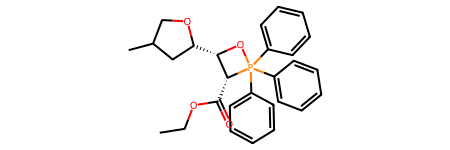

In [520]:
m = Chem.MolFromSmiles(oxaphosphetane_df.loc[10001, 'smiles'])
m

In [537]:
op_templates = {
    "tetrasub": Chem.MolFromSmarts("C1([!#1])([!#1])OPC1([!#1])([!#1])"),
    "trisub": (Chem.MolFromSmarts("[CH]1([!#1])OPC1([!#1])([!#1])"), 
               Chem.MolFromSmarts("C1([!#1])([!#1])OP[CH]1([!#1])")),
    "cis": (Chem.MolFromSmarts("[C@H]([!#1])1[P][O][C@@H]([!#1])1"),
            Chem.MolFromSmarts("[C@@H]([!#1])1[P][O][C@H]([!#1])1")),
    "trans": (Chem.MolFromSmarts("[C@H]([!#1])1[P][O][C@H]([!#1])1"),
            Chem.MolFromSmarts("[C@@H]([!#1])1[P][O][C@@H]([!#1])1")),
    "monosub": (Chem.MolFromSmarts("C1([!#1])([#1])OPC1([#1])([#1])"), 
                Chem.MolFromSmarts("C1([#1])([#1])OPC1([!#1])([#1])")),
    "unsub": Chem.MolFromSmarts("C1([#1])([#1])OPC1([#1])([#1])")
}


In [538]:
def classify_op_subtype(smi):
    m = Chem.MolFromSmiles(smi)
    Chem.AddHs(m)
    if m.HasSubstructMatch(op_templates['tetrasub']):
        return 'TETRASUB'

    for template in op_templates['trisub']:
        if m.HasSubstructMatch(template):
            return 'TRISUB'

    for template in op_templates['monosub']:
        if m.HasSubstructMatch(template):
            return 'MONOSUB'
    
    if m.HasSubstructMatch(op_templates['unsub']):
        return 'UNSUB'

    for template in op_templates['cis']:
        if m.HasSubstructMatch(template, useChirality=True):
            return 'CIS'

    for template in op_templates['trans']:
        if m.HasSubstructMatch(template, useChirality=True):
            return 'TRANS'

    return

TRISUB


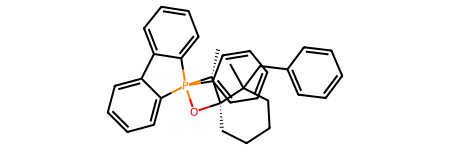

In [539]:
i = 9811
m = Chem.MolFromSmiles(oxaphosphetane_df.loc[i, 'smiles'])
print(classify_op_subtype(oxaphosphetane_df.loc[i, 'smiles']))

m

In [524]:
"[C@]1[P][O][C@H]1"
template = Chem.MolFromSmarts("[C@H]([!#1])1[P][O][C@@H]([!#1])1")
m.HasSubstructMatch(template, useChirality=True)

False

In [541]:
oxaphosphetane_df['subtype'] = [classify_op_subtype(s) for s in oxaphosphetane_df['smiles']]

In [542]:
oxaphosphetane_df.head()

,type,smiles,shadow,subtype
index,,,,
9810,OXAPHOSPHETANE,CCOC(=O)[C@H]1[C@@H](C(C)(C)Cc2ccccc2)OP1(c1cc...,CCOC(=O)C1C=CC=CC=C2C=CC=CC=C3CCCCC[Yb]4[C@@H]...,CIS
9811,OXAPHOSPHETANE,C[C@@H]1[C@]2(CCCCC2(C)Cc2ccccc2)OP12(c1ccccc1...,CC1C=CC=CC=C2C=CC=CC=C3CCCCC[Yb]4[C@]5(CCCCC5(...,TRISUB
9812,OXAPHOSPHETANE,COC(=O)[C@@H]1[C@H]([C@@H]2O[C@@H]2[C@H]2O[C@@...,COC(=O)C1C=CC=CC=C2C=CC=CC=C3CCCCC[Yb]4[C@H]([...,CIS
9813,OXAPHOSPHETANE,C=C[C@H]1CC1[C@H]1OP(c2ccccc2)(c2ccccc2)(c2ccc...,C=C[C@H]1CC1[C@H]1OP234C(=CC=CC=CC2CCCC)C=CC=C...,CIS
9814,OXAPHOSPHETANE,COc1ccc([C@H]2OP(c3ccccc3)(c3ccccc3)(c3ccccc3)...,COc1ccc([C@H]2OP345C(=CC=CC=CC3c3ccccc3)C=CC=C...,CIS


In [543]:
cis_oxaphosphetane_df = oxaphosphetane_df[oxaphosphetane_df['subtype'] == 'CIS']

In [544]:
cis_oxaphosphetane_df.shape

(56898, 4)

In [545]:
save_path = os.path.join(os_nav.find_project_root(), 'data', 'cis_op_for_galaxy')
cis_oxaphosphetane_df.to_csv(save_path)

## UMAP

In [253]:
# Add the directory containing the module to the Python path
sys.path.append('/Users/lucasabounader/PycharmProjects/active_learner')

# Now you can import the module
from clustering import astronaut as astro

In [549]:
PATH = os.path.join(os_nav.find_project_root(), 'data', 'cis_op_for_galaxy')
cis_oxaphosphetane_df = pd.read_csv(PATH)
cis_oxaphosphetane_df.set_index(MoleculeInfo.INDEX.value, inplace=True)

# Display the first few rows of the dataframe
print(df.head())

           type                                             smiles
index                                                             
0      CARBONYL         O=C1CN(Cc2cc(F)c(F)cc2F)S(=O)(=O)c2ccccc21
1      CARBONYL                                 CCC1(C=O)COC(=O)N1
2         YLIDE  C(CCCCCCCCCCCOC1CCCCO1)=P(c1ccccc1)(c1ccccc1)c...
3      CARBONYL                                   O=Cc1cc(Br)ccc1I
4      CARBONYL            CCOC(=O)CC(CC(=O)OCC)CC(=O)c1cccc(OC)c1


In [550]:
cis_op_galaxy = astro.ChemGalaxy("cis_op", data=cis_oxaphosphetane_df)

In [551]:
op_tenD_array = cis_op_galaxy.umap_fingerprints(
    nBits=4096,
    metric=astro.Metric.EUCLIDEAN.value,
    radius=4,
    n_components=10,
    n_neighbors=30
)

In [552]:
op_tenD_array_tight = cis_op_galaxy.umap_fingerprints(
    nBits=4096,
    metric=astro.Metric.EUCLIDEAN.value,
    radius=4,
    n_components=10,
    n_neighbors=50
)

In [553]:
cis_op_2D_array = cis_op_galaxy.umap_fingerprints(
    nBits=4096,
    metric=astro.Metric.EUCLIDEAN.value,
    radius=4,
    n_components=2,
    n_neighbors=20
)

COc1ccc([C@@H]2[C@H](/C=C/S(F)(F)(F)(F)F)OP2(c2ccc(Cl)cc2)(c2ccc(Cl)cc2)c2ccc(Cl)cc2)cc1


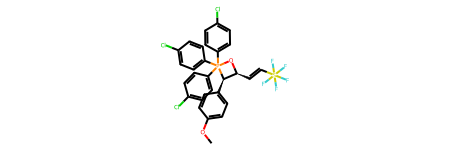

In [556]:
i = 95564
test_smi = cis_oxaphosphetane_df.loc[i].reactant_smiles
print(test_smi)
Chem.MolFromSmiles(test_smi)

In [557]:
cis_oxaphosphetane_df.index.get_loc(i)

37157

In [558]:
def find_nearest_neighbors(points, i, num_closest=9):
    """
    Find the indices of the num_closest points closest to the point at index i.

    Parameters:
    points (numpy.ndarray): Array of point coordinates.
    i (int): Index of the reference point.
    num_closest (int): Number of closest points to find.

    Returns:
    numpy.ndarray: Indices of the num_closest closest points.
    """
    # Extract the reference point
    ref_point = points[i]
    
    # Compute the Euclidean distances from the reference point to all other points
    distances = np.linalg.norm(points - ref_point, axis=1)
    
    # Get the indices of the points sorted by distance
    sorted_indices = np.argsort(distances)
    
    # Exclude the reference point itself
    closest_indices = sorted_indices[sorted_indices != i]
    
    # Return the indices of the num_closest closest points
    return closest_indices[:num_closest]


def find_close_neighbors(points, i, num_neighbors=9, search_neighbors=100):
    """
    Find the indices of the num_neighbors closest points to the point at index i,
    sampled from the nearest search_neighbors points.

    Parameters:
    points (numpy.ndarray): Array of point coordinates.
    i (int): Index of the reference point.
    num_neighbors (int): Number of close neighbors to find.
    search_neighbors (int): Number of nearest neighbors to consider for sampling.

    Returns:
    numpy.ndarray: Indices of the close neighbors in order of closeness.
    """
    # Find the nearest neighbors
    nns = find_nearest_neighbors(points, i, num_closest=search_neighbors)

    # Randomly sample the specified number of neighbors from the nearest neighbors
    sampled_nns = random.sample(list(nns), num_neighbors)

    # Compute the distances of the sampled neighbors to the reference point
    ref_point = points[i]
    distances = np.linalg.norm(points[sampled_nns] - ref_point, axis=1)

    # Sort the sampled neighbors by their distances
    sampled_nns_sorted = [x for _, x in sorted(zip(distances, sampled_nns))]

    return sampled_nns_sorted


In [559]:
op_tenD_array = cis_op_galaxy.umap_coords_locator(
    nBits=4096,
    metric=astro.Metric.EUCLIDEAN.value, 
    n_components=10,
    n_neighbors=30
)

In [560]:
nns

array([ 3722, 39271, 47681, 56665, 24579, 18718, 41004,  3267, 41681])

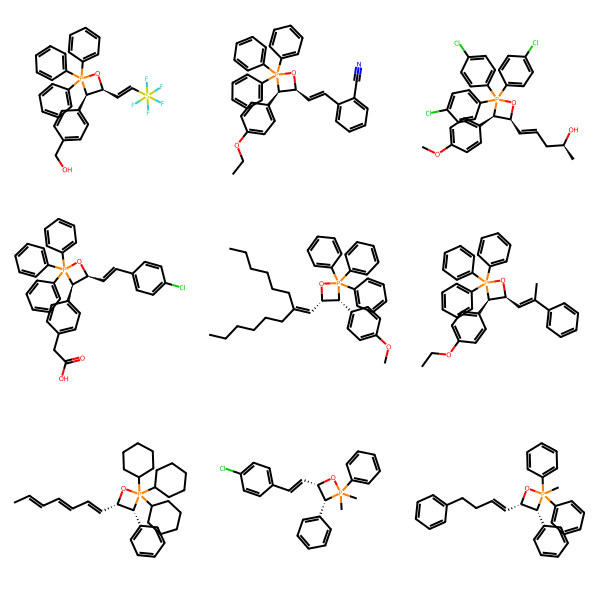

In [561]:
nns = find_nearest_neighbors(op_tenD_array, cis_oxaphosphetane_df.index.get_loc(i))
nbhs = find_close_neighbors(op_tenD_array, cis_oxaphosphetane_df.index.get_loc(i))
nn_mols = []
nb_mols = []
for k in nbhs:
    nb_mols.append(Chem.MolFromSmiles(cis_oxaphosphetane_df.iloc[k]['reactant_smiles']))

for k in nns:
    nn_mols.append(Chem.MolFromSmiles(cis_oxaphosphetane_df.iloc[k]['reactant_smiles']))

Draw.MolsToGridImage(nn_mols)

In [562]:
[print(cis_oxaphosphetane_df.iloc[k]['reactant_smiles']) for k in nns]

OCc1ccc([C@@H]2[C@H](/C=C/S(F)(F)(F)(F)F)OP2(c2ccccc2)(c2ccccc2)c2ccccc2)cc1
CCOc1ccc([C@@H]2[C@H](/C=C/c3ccccc3C#N)OP2(c2ccccc2)(c2ccccc2)c2ccccc2)cc1
COc1ccc([C@@H]2[C@H](/C=C/C[C@H](C)O)OP2(c2ccc(Cl)cc2)(c2ccc(Cl)cc2)c2ccc(Cl)cc2)cc1
O=C(O)Cc1ccc([C@@H]2[C@H](/C=C/c3ccc(Cl)cc3)OP2(c2ccccc2)(c2ccccc2)c2ccccc2)cc1
CCCCCCC(=C[C@@H]1OP(c2ccccc2)(c2ccccc2)(c2ccccc2)[C@@H]1c1ccc(OC)cc1)CCCCCC
CCOc1ccc([C@@H]2[C@H](/C=C(\C)c3ccccc3)OP2(c2ccccc2)(c2ccccc2)c2ccccc2)cc1
C/C=C/C=C/C=C/[C@@H]1OP(C2CCCCC2)(C2CCCCC2)(C2CCCCC2)[C@@H]1c1ccccc1
CP1(C)(c2ccccc2)O[C@@H](/C=C/c2ccc(Cl)cc2)[C@H]1c1ccccc1
CP1(c2ccccc2)(c2ccccc2)O[C@@H](/C=C/CCc2ccccc2)[C@H]1c1ccccc1


[None, None, None, None, None, None, None, None, None]

In [563]:
cis_oxaphosphetane_df.iloc[nns]

,type,reactant_smiles,shadow_smiles,reactant_subtype,Mol,shadow_mol,Morgan_fingerprints_4_4096
index,,,,,,,
100026,OXAPHOSPHETANE,OCc1ccc([C@@H]2[C@H](/C=C/S(F)(F)(F)(F)F)OP2(c...,OCc1ccc(C2C=CC=CC=C3C=CC=CC=C4CCCCC[Yb]5[C@H](...,CIS,<rdkit.Chem.rdchem.Mol object at 0x3fbbf0040>,<rdkit.Chem.rdchem.Mol object at 0x4054118c0>,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
134404,OXAPHOSPHETANE,CCOc1ccc([C@@H]2[C@H](/C=C/c3ccccc3C#N)OP2(c2c...,CCOc1ccc(C2C=CC=CC=C3C=CC=CC=C4CCCCC[Yb]5[C@H]...,CIS,<rdkit.Chem.rdchem.Mol object at 0x3fd78e110>,<rdkit.Chem.rdchem.Mol object at 0x408caf990>,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
119254,OXAPHOSPHETANE,COc1ccc([C@@H]2[C@H](/C=C/C[C@H](C)O)OP2(c2ccc...,COc1ccc(C2C=CC=CC=C3C=CC=CC=C4CCCCC[Yb]5[C@H](...,CIS,<rdkit.Chem.rdchem.Mol object at 0x3fccd7300>,<rdkit.Chem.rdchem.Mol object at 0x4054f8c10>,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
74540,OXAPHOSPHETANE,O=C(O)Cc1ccc([C@@H]2[C@H](/C=C/c3ccc(Cl)cc3)OP...,O=C(O)Cc1ccc(C2C=CC=CC=C3C=CC=CC=C4CCCCC[Yb]5[...,CIS,<rdkit.Chem.rdchem.Mol object at 0x3f89bf4c0>,<rdkit.Chem.rdchem.Mol object at 0x4015e0dd0>,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
66244,OXAPHOSPHETANE,CCCCCCC(=C[C@@H]1OP(c2ccccc2)(c2ccccc2)(c2cccc...,CCCCCCC(=C[C@@H]1OP234C(=CC=CC=CC2c2ccc(OC)cc2...,CIS,<rdkit.Chem.rdchem.Mol object at 0x3f895bdf0>,<rdkit.Chem.rdchem.Mol object at 0x40157d700>,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
35328,OXAPHOSPHETANE,CCOc1ccc([C@@H]2[C@H](/C=C(\C)c3ccccc3)OP2(c2c...,CCOc1ccc(C2C=CC=CC=C3C=CC=CC=C4CCCCC[Yb]5[C@H]...,CIS,<rdkit.Chem.rdchem.Mol object at 0x3ef73c6d0>,<rdkit.Chem.rdchem.Mol object at 0x3ffe09f50>,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
120574,OXAPHOSPHETANE,C/C=C/C=C/C=C/[C@@H]1OP(C2CCCCC2)(C2CCCCC2)(C2...,C/C=C/C=C/C=C/[C@@H]1OP234C(=CC=CC=CC2c2ccccc2...,CIS,<rdkit.Chem.rdchem.Mol object at 0x3fcce78b0>,<rdkit.Chem.rdchem.Mol object at 0x408c091c0>,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
17339,OXAPHOSPHETANE,CP1(C)(c2ccccc2)O[C@@H](/C=C/c2ccc(Cl)cc2)[C@H...,Clc1ccc(/C=C/[C@@H]2OP345C(=CC=CC=CC3c3ccccc3)...,CIS,<rdkit.Chem.rdchem.Mol object at 0x3ef664200>,<rdkit.Chem.rdchem.Mol object at 0x3fde31a80>,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
107344,OXAPHOSPHETANE,CP1(c2ccccc2)(c2ccccc2)O[C@@H](/C=C/CCc2ccccc2...,C1=CC=C2C=CC=CC=C3CCCCC[Yb]4[C@H](/C=C/CCc5ccc...,CIS,<rdkit.Chem.rdchem.Mol object at 0x3fcc48350>,<rdkit.Chem.rdchem.Mol object at 0x405469bd0>,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


## Cluster Analysis

Clustering performed in 10 dimensions, then visualized in 2 dimensions.

In [564]:
labels_loose = hdbscan.HDBSCAN(
    min_samples=5,
    min_cluster_size=100,
).fit_predict(op_tenD_array)

labels_tight = hdbscan.HDBSCAN(
    min_samples=5,
    min_cluster_size=100,
).fit_predict(op_tenD_array_tight)

labels_forced = hdbscan.HDBSCAN(
    min_samples=1,
    min_cluster_size=100,
).fit_predict(op_tenD_array)

In [565]:
def get_var_name(var):
    for name, value in globals().items():
        if value is var:
            return name
            
n_points = len(cis_op_2D_array)
def pprint_num_clustered(labels):
    print(f"{get_var_name(labels)} clustered {100 * len([_ for k in labels if k >= 0]) / n_points} % of the data.")

for labels in [labels_loose, labels_tight, labels_forced]:
    pprint_num_clustered(labels)

labels clustered 53.48694154451826 % of the data.
labels clustered 66.29934268339836 % of the data.
labels clustered 63.15687721888291 % of the data.


### Matplotlib Plots

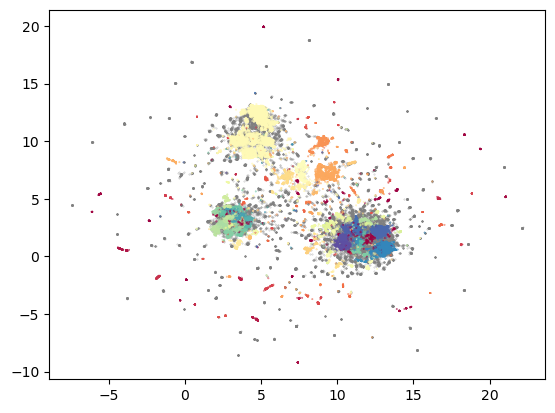

In [566]:
clustered = (labels_loose >= 0)
plt.scatter(cis_op_2D_array[~clustered, 0],
            cis_op_2D_array[~clustered, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(cis_op_2D_array[clustered, 0],
            cis_op_2D_array[clustered, 1],
            c=labels[clustered],
            s=0.1,
            cmap='Spectral');

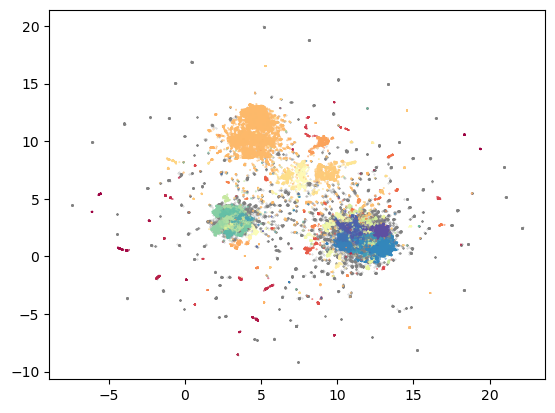

In [567]:
clustered = (labels_tight >= 0)
plt.scatter(cis_op_2D_array[~clustered, 0],
            cis_op_2D_array[~clustered, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(cis_op_2D_array[clustered, 0],
            cis_op_2D_array[clustered, 1],
            c=labels_tight[clustered],
            s=0.1,
            cmap='Spectral');

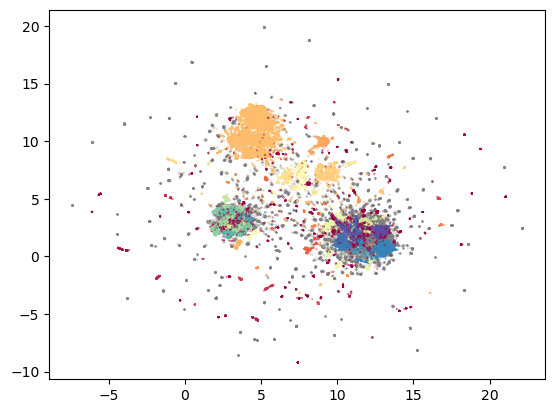

In [569]:
clustered = (labels_forced >= 0)
plt.scatter(cis_op_2D_array[~clustered, 0],
            cis_op_2D_array[~clustered, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(cis_op_2D_array[clustered, 0],
            cis_op_2D_array[clustered, 1],
            c=labels_tight[clustered],
            s=0.1,
            cmap='Spectral');

### Plotly plots

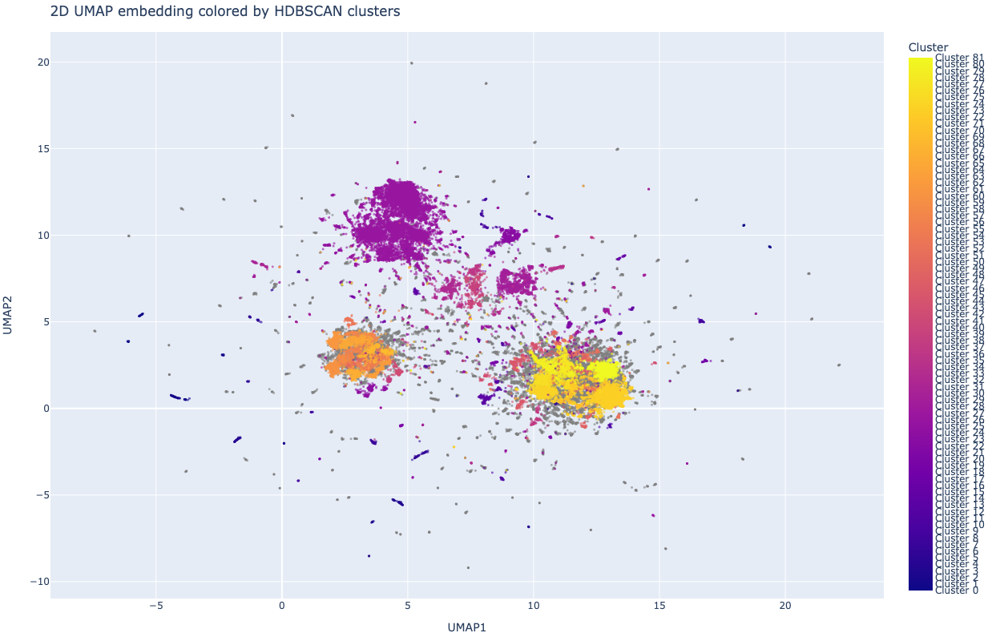

In [570]:
# Identify clustered and non-clustered points
labels = labels_tight

clustered = (labels >= 0)
non_clustered = (labels == -1)

# Create a DataFrame for Plotly
df_clustered = pd.DataFrame({
    'UMAP1': cis_op_2D_array[clustered, 0],
    'UMAP2': cis_op_2D_array[clustered, 1],
    'Cluster': labels[clustered]
})

df_non_clustered = pd.DataFrame({
    'UMAP1': cis_op_2D_array[non_clustered, 0],
    'UMAP2': cis_op_2D_array[non_clustered, 1],
    'Cluster': ['Noise'] * np.sum(non_clustered)
})

# Plot non-clustered points in gray
fig = px.scatter(df_non_clustered, x='UMAP1', y='UMAP2',
                 color_discrete_sequence=['gray'],
                 opacity=0.5,
                 title='2D UMAP embedding colored by HDBSCAN clusters')

# Plot clustered points
fig.add_trace(px.scatter(df_clustered, x='UMAP1', y='UMAP2',
                         color='Cluster',
                         color_continuous_scale='Spectral',
                         opacity=0.7).data[0])

# Customize the layout for higher quality and interactivity
fig.update_layout(
    autosize=False,
    width=1000,
    height=800,
    margin=dict(l=40, r=40, b=40, t=40),
    coloraxis_colorbar=dict(
        title="Cluster",
        tickvals=np.unique(labels),
        ticktext=[f'Cluster {i}' if i >= 0 else 'Noise' for i in np.unique(labels)]
    ),
    legend=dict(title='Legend', itemsizing='constant')
)

# Adjust marker size and transparency
fig.update_traces(marker=dict(size=3, opacity=0.6))

# Show the interactive plot
fig.show()

### Cluster centers

In [571]:
# Function to approximate the cluster center using the mean
def compute_cluster_center(cluster_points):
    return np.mean(cluster_points, axis=0)

# Function to calculate cluster centers for all clusters
def calculate_all_cluster_centers(points, labels):
    unique_labels = np.unique(labels)
    cluster_centers = []
    for label in unique_labels:
        if label >= 0:  # Ignore noise
            cluster_points = points[labels == label]
            cluster_center = compute_cluster_center(cluster_points)
            cluster_centers.append(cluster_center)
    return np.array(cluster_centers)

# Function to approximate the cluster center using the mean and return the index
def compute_cluster_center_with_index(cluster_points):
    # Compute the mean of the cluster points
    cluster_center = np.mean(cluster_points, axis=0)
    # Find the index of the point closest to the cluster center
    closest_index = np.argmin(np.linalg.norm(cluster_points - cluster_center, axis=1))
    return cluster_center, closest_index

# Function to calculate cluster centers for all clusters and return their indices
def calculate_all_cluster_centers_with_indices(points, labels):
    unique_labels = np.unique(labels)
    cluster_centers = []
    cluster_center_indices = []
    for label in unique_labels:
        if label >= 0:  # Ignore noise
            cluster_points = points[labels == label]
            cluster_center, closest_index = compute_cluster_center_with_index(cluster_points)
            cluster_centers.append(cluster_center)
            cluster_center_indices.append(np.where(labels == label)[0][closest_index])
    return np.array(cluster_centers), cluster_center_indices

In [572]:
# Calculate cluster centers and their indices in 10D space
cluster_centers_10d, cluster_center_indices_10d = calculate_all_cluster_centers_with_indices(op_tenD_array, labels)

print("Indices of cluster centers in 10D space:")
print(len(cluster_center_indices_10d))
print(cluster_center_indices_10d)

df_indices = cis_oxaphosphetane_df.index[cluster_center_indices_10d]
print(df_indices)

Indices of cluster centers in 10D space:
82
[29422, 37179, 3699, 16341, 48458, 1066, 18842, 38006, 53391, 7609, 44319, 645, 28693, 5051, 28430, 9968, 17386, 44779, 35579, 1330, 37683, 3624, 46756, 27180, 23871, 27481, 9525, 37560, 38402, 35803, 22774, 34764, 15438, 24105, 55597, 36581, 54375, 30356, 7086, 55254, 11409, 23334, 39987, 15192, 21038, 12373, 35692, 37038, 14288, 18734, 51671, 31172, 41956, 47907, 12076, 20864, 7481, 47494, 30, 18031, 26241, 20678, 4995, 15757, 42941, 45956, 24907, 3753, 32525, 28329, 44234, 47954, 37157, 26, 15747, 39284, 12448, 33673, 6437, 23271, 33137, 9481]
Index([ 77722,  95612,  18621,  47570, 121454,  12557,  53266,  97554, 132800,
        27527, 112026,  11585,  76036,  21669,  75426,  32992,  49934, 113096,
        91964,  13173,  96778,  18435, 117608,  72492,  64902,  73196,  31968,
        96492,  98444,  92474,  62336,  90054,  45436,  65446, 137832,  94240,
       134986,  79870,  26343, 137034,  36278,  63658, 102034,  44874,  58300,
        

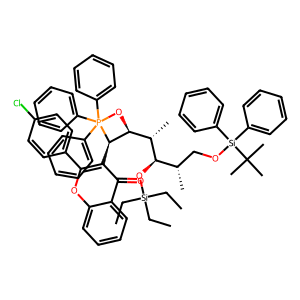

In [579]:
cluster_num = 28
center_index = df_indices[cluster_num]

Draw.MolToImage(cis_oxaphosphetane_df.loc[center_index, 'Mol'])

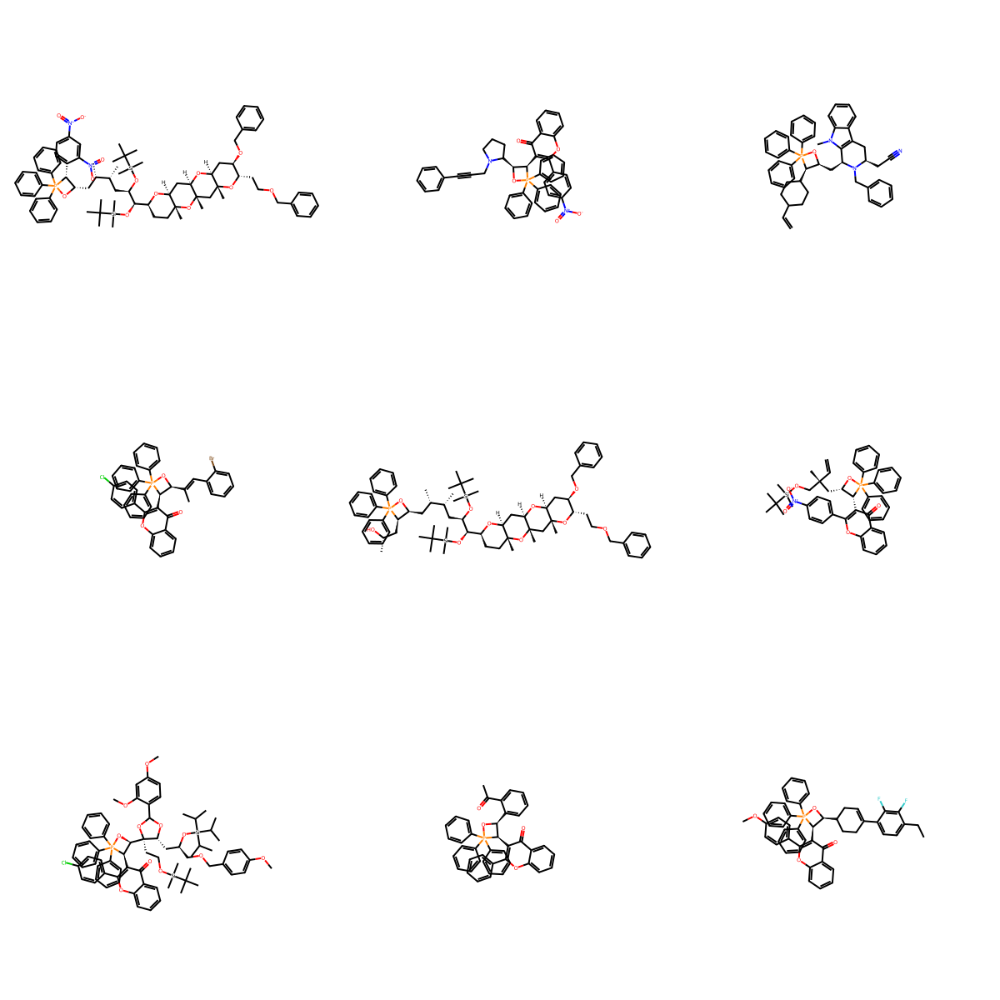

In [580]:
cluster_sample = cis_oxaphosphetane_df[labels == cluster_num].sample(9)
Draw.MolsToGridImage(cluster_sample['Mol'].to_list(), subImgSize=(400,400), molsPerRow=3)

In [575]:
cis_op_center_mols = cis_op_galaxy.chemdata.loc[df_indices, 'Mol']
for s in cis_op_galaxy.chemdata.loc[df_indices, 'reactant_smiles'].to_list():
    print(s)
# Draw.MolsToGridImage(cis_op_center_mols, molsPerRow=2, subImgSize=(700, 700), maxMols=100)

CC(C)C[C@@H](NC(=O)OC(C)(C)C)[C@@H]1OP(c2ccccc2)(c2ccccc2)(c2ccccc2)[C@@H]1C1=C(C(=O)OC(c2ccccc2)c2ccccc2)N2C(=O)[C@@H](NC(=O)Cc3ccccc3)[C@H]2SC1
Cc1ccc(C)n2nc([C@@H]3[C@H]([C@@H]4OC(C)(C)O[C@@H]4CC/C=C/[C@@H]4OC(C)(C)O[C@@H]4CCOC[C@H]4COC(C)(C)O4)OP3(c3ccccc3)(c3ccccc3)c3ccccc3)nc12
CCOC(=O)CC1O[C@@H](CC(=O)OCC)C[C@@H]([C@@H]2[C@H]([C@H]3CC[C@H](CC(=O)c4ccccc4)[C@@H]([N+](=O)[O-])[C@@H]3CCc3ccccc3)OP2(c2ccccc2)(c2ccccc2)c2ccccc2)O1
CCCCCCCCOc1ccc(NC(=O)[C@@](C)(NC(=O)OC(C)(C)C)[C@@H]2OP(c3ccccc3)(c3ccccc3)(c3ccccc3)[C@@H]2c2ccc3c(c2)c2cc(-c4ccc(C)cc4)ccc2n3CCC(C)CCCC(C)C)cc1
CCOC(=O)[C@@H]1Oc2ccccc2[C@@H](C[C@@H]2OP(c3ccccc3)(c3ccccc3)(c3ccccc3)[C@@H]2c2c(-c3ccc(F)cc3)noc2C)[C@@]12C(=O)N(C(=O)OC(C)(C)C)c1ccccc12
COc1ccc(CO[C@@H]2CC(O[Si](C)(C)C(C)(C)C)=C(Br)[C@H]2C[C@@H]2OP(c3ccccc3)(c3ccccc3)(c3ccccc3)[C@@H]2c2cc3[nH]c2c(-c2cc(C)cc(C)c2)c2nc(c(-c4cc(C)cc(C)c4)c4ccc([nH]4)c(-c4cc(C)cc(C)c4)c4nc(c3-c3cc(C)cc(C)c3)C=C4)C=C2)cc1
CCCCCCOc1ccc(-n2c3ccccc3c3cc([C@@H]4[C@H](C[C@]56O[C@H](C(=

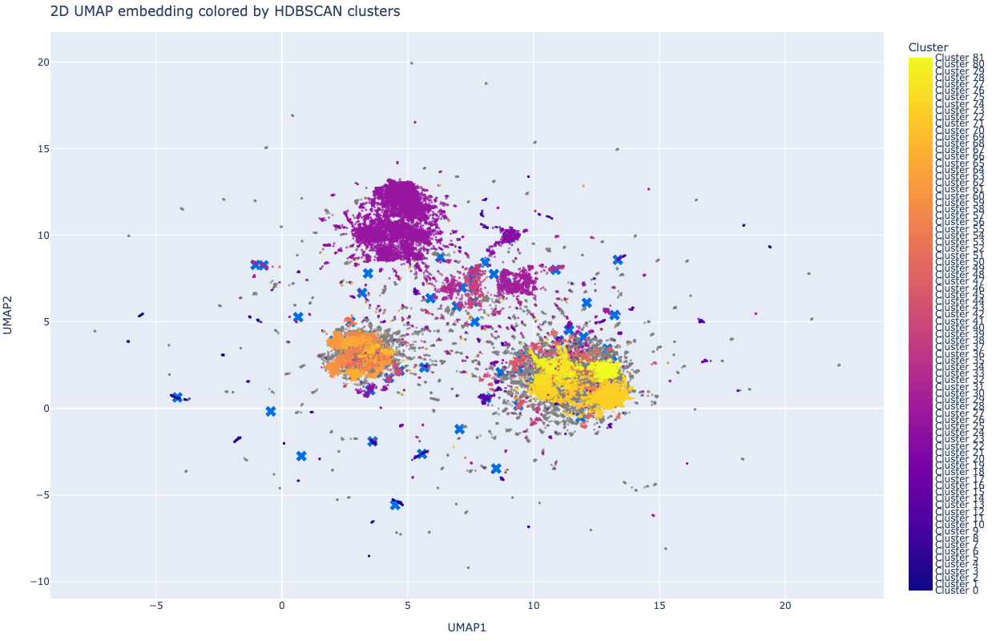

In [576]:
labels = labels_tight

# Identify clustered and non-clustered points
clustered = (labels >= 0)
non_clustered = (labels == -1)

# Create a DataFrame for Plotly
df_clustered = pd.DataFrame({
    'UMAP1': cis_op_2D_array[clustered, 0],
    'UMAP2': cis_op_2D_array[clustered, 1],
    'Cluster': labels[clustered]
})

df_non_clustered = pd.DataFrame({
    'UMAP1': cis_op_2D_array[non_clustered, 0],
    'UMAP2': cis_op_2D_array[non_clustered, 1],
    'Cluster': ['Noise'] * np.sum(non_clustered)
})

# Plot non-clustered points in gray
fig = px.scatter(df_non_clustered, x='UMAP1', y='UMAP2',
                 color_discrete_sequence=['gray'],
                 opacity=0.5,
                 title='2D UMAP embedding colored by HDBSCAN clusters')

# Plot clustered points
fig.add_trace(px.scatter(df_clustered, x='UMAP1', y='UMAP2',
                         color='Cluster',
                         color_continuous_scale='Spectral',
                         opacity=0.7).data[0])

# Customize the layout for higher quality and interactivity
fig.update_layout(
    autosize=False,
    width=1000,
    height=800,
    margin=dict(l=40, r=40, b=40, t=40),
    coloraxis_colorbar=dict(
        title="Cluster",
        tickvals=np.unique(labels),
        ticktext=[f'{i}' if i >= 0 else 'Noise' for i in np.unique(labels)]
    ),
    legend=dict(title='Legend', itemsizing='constant')
)

# Adjust marker size and transparency
fig.update_traces(marker=dict(size=3, opacity=0.7))

# Calculate cluster centers in 2D space for visualization
cluster_centers_2d = calculate_all_cluster_centers(cis_op_2D_array, labels)

RED = '#dc241f'
DARKBLUE = '#003366'
SKYBLUE = '#006fe6'
NEONGREEN = '#72f770'
center_color = SKYBLUE
# Plot cluster centers in 2D UMAP embedding
fig.add_trace(px.scatter(x=cluster_centers_2d[:, 0], y=cluster_centers_2d[:, 1],
                         color_discrete_sequence=[center_color]).data[0])

# Directly set the marker symbol and size for the cluster centers trace
fig.data[-1].update(marker=dict(symbol='x', size=12, color=center_color))

# Show the updated plot with cluster centers
fig.show()

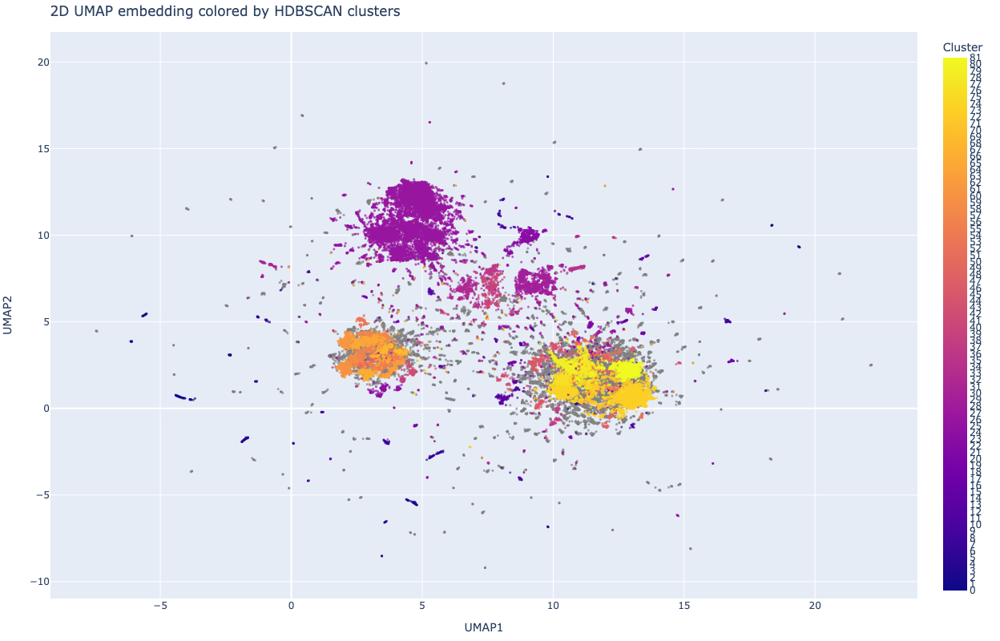

In [581]:
labels = labels_tight

# Identify clustered and non-clustered points
clustered = (labels >= 0)
non_clustered = (labels == -1)

# Create a DataFrame for Plotly
df_clustered = pd.DataFrame({
    'UMAP1': cis_op_2D_array[clustered, 0],
    'UMAP2': cis_op_2D_array[clustered, 1],
    'Cluster': labels[clustered]
})

df_non_clustered = pd.DataFrame({
    'UMAP1': cis_op_2D_array[non_clustered, 0],
    'UMAP2': cis_op_2D_array[non_clustered, 1],
    'Cluster': ['Noise'] * np.sum(non_clustered)
})

# Plot non-clustered points in gray
fig = px.scatter(df_non_clustered, x='UMAP1', y='UMAP2',
                 color_discrete_sequence=['gray'],
                 opacity=0.5,
                 title='2D UMAP embedding colored by HDBSCAN clusters')

# Plot clustered points
fig.add_trace(px.scatter(df_clustered, x='UMAP1', y='UMAP2',
                         color='Cluster',
                         color_continuous_scale='Spectral',
                         opacity=0.7).data[0])

# Customize the layout for higher quality and interactivity
fig.update_layout(
    autosize=False,
    width=1000,
    height=800,
    margin=dict(l=40, r=40, b=40, t=40),
    coloraxis_colorbar=dict(
        title="Cluster",
        tickvals=np.unique(labels),
        ticktext=[f'{i}' if i >= 0 else 'Noise' for i in np.unique(labels)]
    ),
    legend=dict(title='Legend', itemsizing='constant')
)

# Adjust marker size and transparency
fig.update_traces(marker=dict(size=3, opacity=0.7))

# Show the updated plot with cluster centers
fig.show()